In [ ]:
import numpy as np
import pandas as pd
import tqdm
import re
from collections import defaultdict

In [ ]:
from io import BytesIO
from PIL import Image
import requests
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
import gensim
from scipy.sparse import coo_matrix, csr_matrix, find
from scipy.sparse.linalg import svds
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import Normalizer

from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer

# Домашнее задание

Data contains the book rating information. Ratings (Book-Rating) are either explicit, expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit, expressed by 0.

### 1. Реализовать персональный топ  - принимает на вход пол и локацию, на выходе персональный топ   - 1 балл

Персональный топ - это топ товаров по похожим возрасту/интересам/локации. Как сделать? Разбить на сегменты по выбраным признакам. Топ делать по книгам с хорошим средним рейтингом.

### 2. На основе метода кластеризации похожих пользователей построить рекомендации (Слайд 25) - 2 балла

Нужно топ-10 рекомендаций с самой высокой оценкой. Считаем среднюю оценку для каждой книги по кластеру и выводим топ-10 книг.

### 3. Применить методы расмотренные на лекции (Совстречаемость - 2 балл, Content-based - 1 балл, Коллаборативная фильтрация - 3 балла , Матричная Факторизация - 1 балл) - 7 баллов

В совстречаемости также учитывать оценки. Вес пары книг встретившихся у пользователя - полусумма их оценок

Коллаборативную фильтрацию реализовывать как на слайде 50 презентации, посоветовав каждому пользователю топ-10 книг с самой высокой оценкой. Сделать рекомендации User-based и Item-based и сравнить.

Если совсем сложно - можно сделать как в семинарской части, поставив оценку "0", если рейтинг < 5 и "1" - в противном случае. Тогда максимум за это - 1 балл.

Для Content-based, Коллаборативной фильтрации, Матричной Факторизации реализовать U2I и I2I рекомендации

### Примечание:

Так как пользователей много - можно зафиксировать несколько произвольных и для них уже составлять рекомендации
Работоспособность I2I можно проверять на известных книгах (Гарри Поттер, Властелин Колец, Интервью с вампиром, Код-Да-Винчи, Маленький Принц)
Рейтинг книг обязательно нужно учитывать

Не забываем также предобработать данные - выкинуть выбросы-пользователей и выбросы-книги.

# Дедлайн 30 ноября
# Жесткий дедлайн - 7 декабря

Выводить в качестве рекомендаций лучше названия книг, картинки (если они есть) и соответствующие метрики близости.
Присылать в виде ноутбука


In [8]:
books = pd.read_csv("BX-Books.csv")
books = books.drop_duplicates()

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [9]:
books.head(5)

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [10]:
books = books.dropna()

In [11]:
interactions = pd.read_csv("BX-Book-Ratings.csv", sep=";", encoding = "ISO-8859-1")
interactions = interactions.drop_duplicates()
interactions = interactions[interactions["Book-Rating"] != 0]

In [12]:

books_meets = interactions.groupby("ISBN")["User-ID"].count().reset_index().rename(columns={"User-ID": "user_num"})

In [13]:
user_meets = interactions.groupby("User-ID")["ISBN"].count().reset_index().rename(columns={"ISBN": "books_num"})

In [14]:
interactions = interactions.merge(books_meets, on=["ISBN"]).merge(user_meets, on=["User-ID"])

In [15]:
interactions = interactions[(interactions["user_num"] > 5) & 
                            (interactions["books_num"] > 5) &
                            (interactions["books_num"] < 200)]

In [16]:
users = pd.read_csv('BX-Users.csv', delimiter=';', encoding = 'ISO-8859-1')

In [17]:
users = users.dropna()
users = users.drop_duplicates()

In [18]:
interactions = interactions.merge(books[["ISBN", "Image-URL-M", "Book-Title"]].rename(
    columns={"Image-URL-M": "picture_url"}), on=["ISBN"])

**Персональный топ**

Персональный топ - это топ товаров по похожим возрасту/интересам/локации. Как сделать? Разбить на сегменты по выбраным признакам. Топ делать по книгам с хорошим средним рейтингом.



In [19]:
def chunks(l, n):
    for i in range(0, len(l), n):
        yield l[i:i + n]

def rec_imaging(product_ids, urls, measure=None, top_n=5):
    cnt = 0
    for idx, chunk in enumerate(chunks(urls, top_n)):
        fig = plt.figure(figsize=(20, 4))
        for n, i in enumerate(chunk):
            try:
                r = requests.get(i)
                im = Image.open(BytesIO(r.content))

            except:
                print('Something went wrong with {url}'.format(url=i))
                continue

            a = fig.add_subplot(1, top_n, n + 1)
            if measure is not None:
                a.title.set_text("measure = {}".format(np.round(measure[cnt], 4)))
                cnt += 1
            plt.imshow(im)
            plt.axis('off')
        plt.show()

In [20]:
class PersonalTop:
  """Используется для холодного старта рекоммендаций пользователю
     Выбирает лучшие книги по оценкам в определенной стране и в определенном
     возрастном диапазоне (плюс-минус 3 года)
     Для датасетов больших размеров можно было бы сделать еще выбор вплоть до
     города, но тут даже для отдельных стран иногда не хватает информации
  """

  def __init__(self, interactions, users):
    self.interactions = interactions.copy()
    self.users = users.copy()
    self.users['Country'] = self.users['Location'].apply(self.extract_country)
    self.users = self.users.drop(['Location'], axis=1)

  @staticmethod
  def extract_country(location):
    location = location.split(',')
    if not location or len(location) < 3:
      return None
    if not location[2]:
      return None
    return location[2].strip()
  
  def top(self, location, age, top_n=10):
    country = self.extract_country(location)
    users_group = self.users

    # Выбираем пользователей из той же страны (если она указана)
    if country:
      users_group = users_group[users_group['Country'] == country]
    # Выбираем пользователей с похожим возрастом
    users_group = users_group[(users_group['Age'] <= age+3) & (users_group['Age'] >= age-3)]
    # Выбираем взаимодействия для данных пользователей
    users_top = self.interactions.loc[interactions['User-ID'].isin(users_group['User-ID'])]

    def mean_withot_zero(ratings):
      if (ratings == 0).all():
        return 0
      return ratings.sum() / ratings[ratings != 0].count()

    # Для книг считаем среднюю оценку по выбранной группе
    isbn_ratings = users_top.groupby(['ISBN', 'picture_url'])['Book-Rating']\
                            .apply(mean_withot_zero)\
                            .reset_index()\
                            .rename(columns={"Book-Rating": "rating"})
                            
    # Сортируем книги по оценке и выводим наилучшие
    isbn_ratings = isbn_ratings.sort_values('rating', ascending=False).reset_index()
    if top_n > isbn_ratings.shape[0]:
      top_n = isbn_ratings.shape[0]
    if isbn_ratings.empty:
      print('No data for such location and age')
      return
    rec_imaging(isbn_ratings[:top_n]['ISBN'], isbn_ratings[:top_n]['picture_url'], measure=isbn_ratings['rating'])

In [21]:
top = PersonalTop(interactions=interactions, users=users)

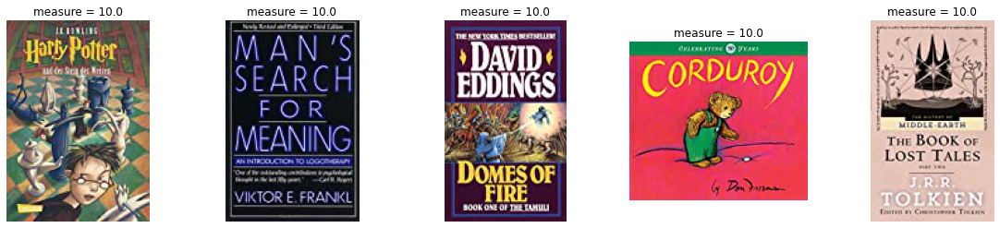

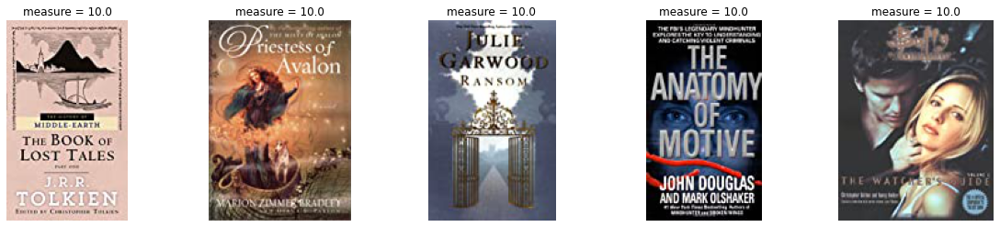

In [22]:
top.top('tacoma, washington, usa', 18, top_n=10)

2. **На основе метода кластеризации похожих пользователей построить рекомендации (Слайд 25) - 2 балла**

Нужно топ-10 рекомендаций с самой высокой оценкой. Считаем среднюю оценку для каждой книги по кластеру и выводим топ-10 книг.

In [23]:
class ClasteringTop:

  def __init__(self, interactions):
    self.interactions = interactions.copy()
    self.book_encoder = LabelEncoder()
    self.user_encoder = LabelEncoder()
    self.interactions['Enc_ISBN'] = self.book_encoder.fit_transform(self.interactions['ISBN'])
    self.interactions['Enc_User-ID'] = self.user_encoder.fit_transform(self.interactions['User-ID'])
    # Матрица взаимодействий
    self.interaction_matrix = coo_matrix((self.interactions["Book-Rating"], (self.interactions["Enc_User-ID"], self.interactions["Enc_ISBN"])), 
                            shape=(len(set(self.interactions["Enc_User-ID"])), len(set(self.interactions["Enc_ISBN"]))))    
  
  def cluster(self):
    # Нормализуем и кластеризуем матрицу взаимодействий
    normalizer = Normalizer()
    interaction_matrix_scaled = normalizer.fit_transform(self.interaction_matrix.tocsr())
    self.clustering = DBSCAN(eps=0.62, min_samples=2, metric='cosine').fit(interaction_matrix_scaled)
  
  def top(self, user_id, top_n=10):
    # Получаем ID пользователя в матрице взаимодействий
    try:
      user_id_enc = self.user_encoder.transform([user_id])[0]
    except:
      print('Undefined user ID')
      return

    # Получаем кластер, которому принадлежит пользователь
    cluster_num = self.clustering.labels_[user_id_enc]
    # Получаем остальных пользователей из кластера
    indexes = np.where(self.clustering.labels_ == cluster_num)[0]
    interaction_matrix_csr = self.interaction_matrix.tocsr()
    claster_user = interaction_matrix_csr[indexes]
    # Считаем средний рейтинг книг по кластеру
    books_ratings = pd.Series(claster_user.sum(axis=1).flat) / pd.Series(np.count_nonzero(claster_user.toarray(), axis=1))
    books_ratings = books_ratings.sort_values(ascending=False).reset_index()
    # Выбираем книги с наивысшим рейтингом
    if top_n > books_ratings.shape[0]:
      top_n = books_ratings.shape[0]
    top_books_id_enc = books_ratings.index[:top_n]
    top_books_isbn = self.book_encoder.inverse_transform(top_books_id_enc)[:top_n]
    books = self.interactions.groupby(['ISBN', 'picture_url']).size().reset_index()
    books = books[books['ISBN'].isin(top_books_isbn)]
    # Отрисовываем
    rec_imaging(books['ISBN'], books['picture_url'])


In [24]:
Ctop = ClasteringTop(interactions)

In [25]:
Ctop.cluster()

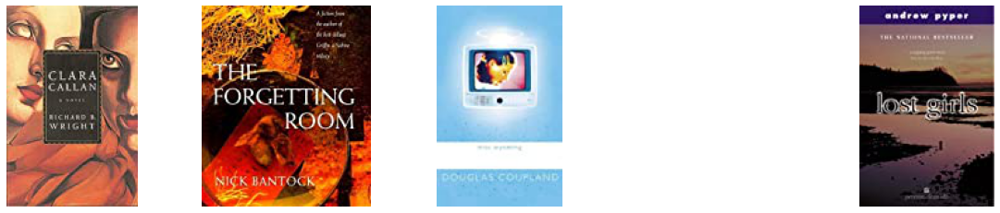

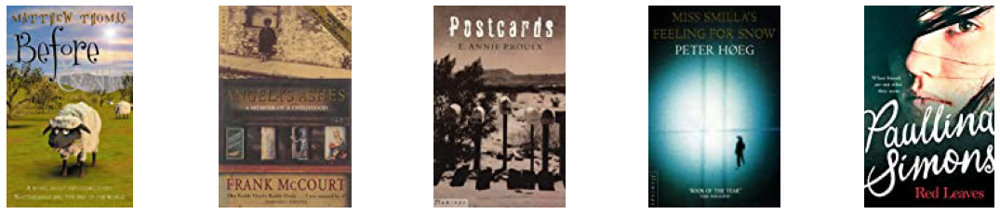

In [26]:
Ctop.top(276866)

3. Применить методы расмотренные на лекции (Совстречаемость - 2 балл, Content-based - 1 балл, Коллаборативная фильтрация - 3 балла , Матричная Факторизация - 1 балл) - 7 баллов

Совстречаемость

In [27]:
class OccurrenceModel:
  def __init__(self, interactions):
    self.interactions = interactions.copy()
    self.book_encoder = LabelEncoder()
    self.books = self.interactions[['ISBN', 'picture_url']].drop_duplicates().reset_index()
    self.coo_ratings = None
      
  def fit(self): 
    table = self.interactions[['User-ID', 'ISBN', 'Book-Rating']]
    # Мерджим товары сами с собой, чтобы посмотреть, какие пары товаров пользователь покупал вместе
    table = table.merge(table, on='User-ID' )
    # Удаляем дубликаты
    table = table[table['ISBN_x'] != table['ISBN_y']]
    # Считаем средний рейтинг
    table['AvgRating'] = (table['Book-Rating_x'] + table['Book-Rating_y']) * 0.5
    table = table.drop(['Book-Rating_x', 'Book-Rating_y'], axis=1)
    # Выбираем только те пары, которые были встречены более чем у одного пользователя
    table = table[(table.groupby(['ISBN_x', 'ISBN_y'])[['ISBN_x', 'ISBN_y']].transform('count')>1)['ISBN_y']]
    # Собираем суммарную статистику по совстрчаемости товаров
    self.coo_ratings = table.groupby(['ISBN_x', 'ISBN_y'])['AvgRating'].sum()
    
  def recommend(self, book_isbn, top_n=10):
    if self.coo_ratings is None:
      raise RuntimeError('call fit() first!')

    # Получаем сопутствующие книги и сортируем по рейтингу
    coo_book_ratings = self.coo_ratings[book_isbn]
    coo_book_ratings = coo_book_ratings.sort_values(ascending=False).reset_index()
    if top_n > coo_book_ratings.shape[0]:
      top_n = coo_book_ratings.shape[0]
    coo_book_ratings = coo_book_ratings[:top_n]
    print('Для книги:')
    rec_imaging([book_isbn], self.books[self.books['ISBN'] == book_isbn]['picture_url'])
    print('Рекомендации:')
    rec_imaging(coo_book_ratings['ISBN_y'],
                self.books[self.books['ISBN'].isin(coo_book_ratings['ISBN_y'])]['picture_url'], 
                measure=coo_book_ratings['AvgRating'] / 2)

In [28]:
model = OccurrenceModel(interactions=interactions)
model.fit()

Для книги:


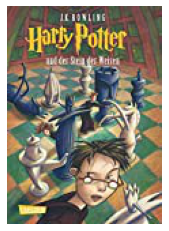

Рекомендации:


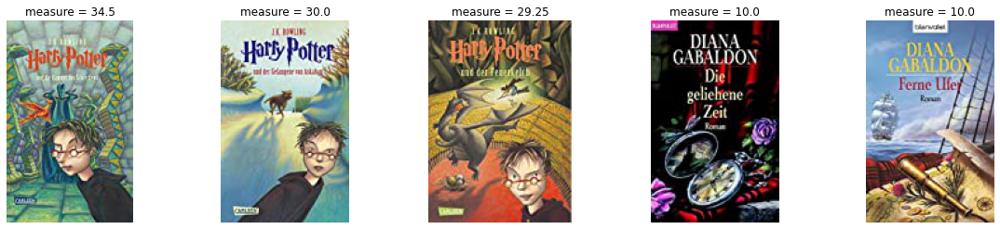

In [29]:
model.recommend('3551551677')

ContentBased

In [30]:
class ContentBasedModel:
  FEATURES_COUNT = 500

  def __init__(self, interactions):
    self.interactions = interactions.copy()
    self.books = self.interactions[['ISBN', 'Book-Title', 'picture_url']].drop_duplicates('ISBN').reset_index()
    self.wv = None
  
  def __avg_feature_vector(self, words):
    feature_vec = np.zeros((self.FEATURES_COUNT, ), dtype='float32')
    n_words = 0
    for word in words:
      if word in self.index2word_set:
        n_words += 1
        feature_vec = np.add(feature_vec, self.wv[word])
    if (n_words > 0):
        feature_vec = feature_vec / n_words
    return feature_vec

  def fit(self):
    item_description = [gensim.utils.simple_preprocess(re.sub("[^a-zA-Zа-яА-Я]+", " ", sentence.lower()))
                        for sentence in self.books['Book-Title']]
    # Тренируем модель по текстам
    model = gensim.models.Word2Vec(
      item_description,
      size=self.FEATURES_COUNT,
      window=10,
      min_count=1,
      iter=50
    )
    self.wv = model.wv
    self.index2word_set = set(self.wv.index2word)
    # Заполняем эмбединги усредненными векторами
    self.items_embs = np.zeros((len(item_description), self.FEATURES_COUNT))
    for i in range(self.items_embs.shape[0]):
        self.items_embs[i] = self.__avg_feature_vector(item_description[i])
        
        
  def get_rec_I2I(self, isbn, top_n=10):
    if self.wv is None:
      raise RuntimeError('call fit() first')

    # Получаем индекс книги в эмбединге и считаем близость
    index = self.books[self.books['ISBN'] == isbn].index[0]
    metrics = cosine_similarity([self.items_embs[index]], self.items_embs)[0]
    sorted_indexes = np.argsort(metrics)[::-1]
    if top_n + 1 > sorted_indexes.shape[0]:
      top_n = sorted_indexes.shape[0] - 1
    sorted_indexes = sorted_indexes[1:top_n + 1]
    print("Для товара")
    rec_imaging([isbn], self.books[self.books['ISBN'] == isbn]['picture_url'])
    print("Рекомендации:")
    rec_imaging(self.books.loc[sorted_indexes]['ISBN'], 
                self.books.loc[sorted_indexes]['picture_url'],
                measure=np.sort(metrics)[::-1][1:top_n + 1])


  def get_rec_U2I(self, user_id, top_n=10):
    if self.wv is None:
      raise RuntimeError('call fit() first')

    # Выбираем все взаимодействия пользователя
    user_ints = self.interactions[self.interactions["User-ID"] == user_id]
    # Составляем из заголовков предложение для векторизации
    user_vector = " ".join(user_ints["Book-Title"])
    user_processed = gensim.utils.simple_preprocess(re.sub("[^a-zA-Zа-яА-Я]+", " ", user_vector.lower()))
    # Получем эмбединг для пользователя
    user_emb = self.__avg_feature_vector(user_processed)
    metrics = cosine_similarity([user_emb], self.items_embs)[0]
    # Зануляем уже просмотренные
    metrics[self.books[self.books['ISBN'].isin(user_ints['ISBN'])].index] = 0
    sorted_indexes = np.argsort(metrics)[::-1]
    if top_n > sorted_indexes.shape[0]:
      top_n = sorted_indexes.shape[0]
    sorted_indexes = sorted_indexes[:top_n]
    print("Для пользователя, который смотрел товары")
    rec_imaging(user_ints['ISBN'], self.books[self.books['ISBN'].isin(user_ints['ISBN'])]['picture_url'])
    print("Рекомендации:")
    rec_imaging(self.books.loc[sorted_indexes]['ISBN'], 
                self.books.loc[sorted_indexes]['picture_url'],
                measure=np.sort(metrics)[::-1][:top_n])


In [31]:
cb_model = ContentBasedModel(interactions)
cb_model.fit()

Для товара


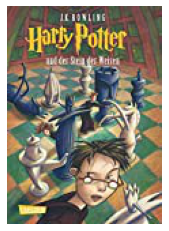

Рекомендации:


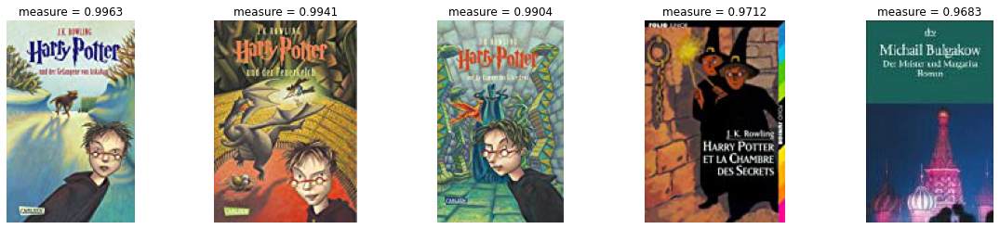

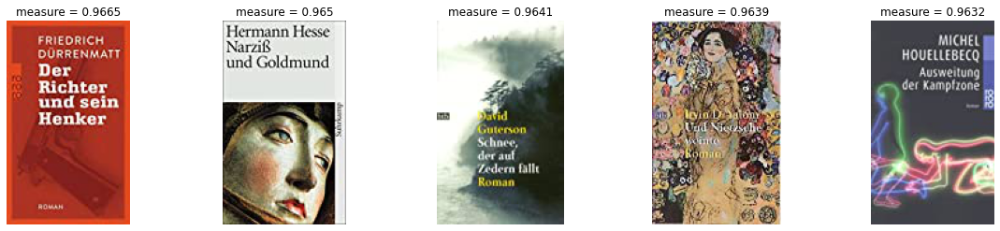

In [32]:
cb_model.get_rec_I2I('3551551677')

Для пользователя, который смотрел товары


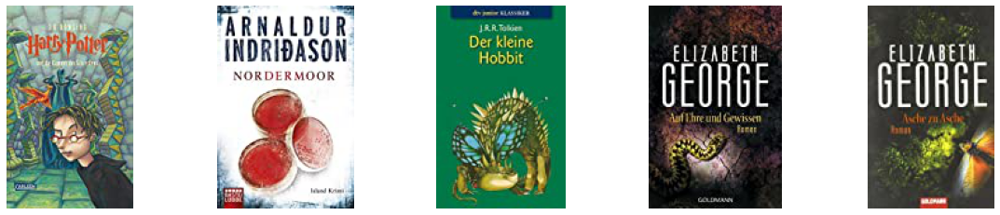

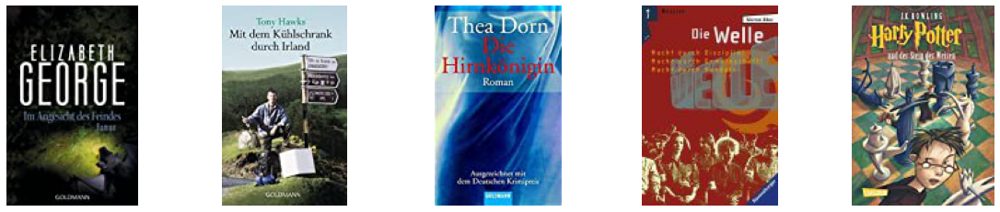

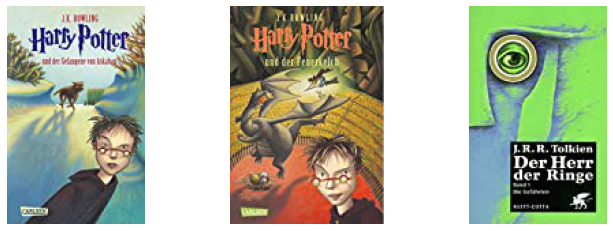

Рекомендации:


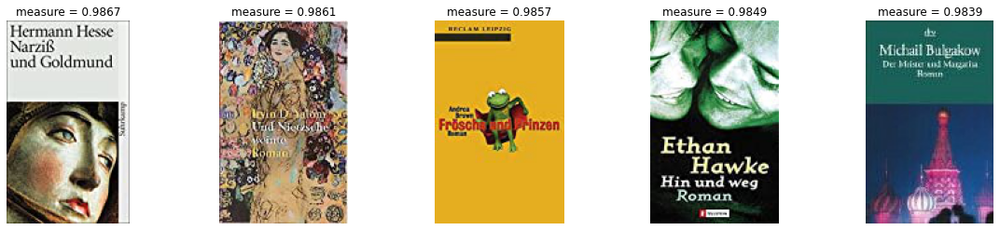

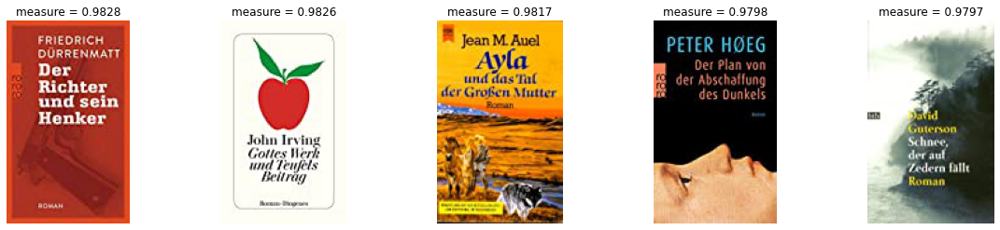

In [33]:
cb_model.get_rec_U2I(276847)

Коллаборативная фильтрация

In [46]:
class CollaborativeModel:
  def __init__(self, interactions):
    interactions = interactions.copy()
    self.book_encoder = LabelEncoder()
    self.user_encoder = LabelEncoder()
    interactions['Enc_ISBN'] = self.book_encoder.fit_transform(interactions['ISBN'])
    interactions['Enc_User-ID'] = self.user_encoder.fit_transform(interactions['User-ID'])

    self.books = interactions[['ISBN', 'picture_url']].drop_duplicates('ISBN').reset_index()
    self.csr_rates = coo_matrix((interactions['Book-Rating'], (interactions['Enc_User-ID'], interactions['Enc_ISBN'])),
                                shape=(len(set(interactions["Enc_User-ID"])), len(set(interactions["Enc_ISBN"]))))

  def user_based(self, user_id, top_n=10):
    enc_user_id = self.user_encoder.transform([user_id])[0]
    user_rates = self.csr_rates.getrow(enc_user_id).toarray()[0]
    watched_items = np.where(user_rates != 0)[0]
    # Похожесть пользователя с другими пользователями
    sim_vec = cosine_similarity([user_rates], self.csr_rates).reshape(-1, 1)
    # Средние оценки пользователей
    (rows, _, values) = find(self.csr_rates)
    countings = np.bincount(rows)
    sums = np.bincount(rows, weights=values)
    average_rates = sums / countings
    # Домножаем оценки c вычетом средних на похожесть пользователей
    rates = csr_matrix.multiply(csr_matrix(self.csr_rates.copy().T - average_rates).T, sim_vec)
    total_rate = np.array(np.sum(rates, axis=0)).ravel()
    total_rate = average_rates[enc_user_id] + total_rate / np.sum(sim_vec)
    # чтобы не рекомендовать уже просмотренные - зануляем веса просмотренных
    total_rate[watched_items] = 0
    # печатаем рекомендации
    self.get_rec(watched_items, np.argsort(total_rate)[::-1][:top_n],
                np.sort(total_rate)[::-1][:top_n])
      
  def item_based(self, book_id, top_n=10):
    book_id_enc = self.book_encoder.transform([book_id])[0]
    item_rates = self.csr_rates.getcol(book_id_enc).toarray().reshape(1, -1)
    metrics = cosine_similarity(item_rates, self.csr_rates.T).reshape(-1, 1)
    # Средние оценки товаров
    (_, columns, values) = find(self.csr_rates)
    countings = np.bincount(columns)
    sums = np.bincount(columns, weights=values)
    average_rates = sums / countings
    # Вычитаем среднюю оценку товара и домножаем на похожесть
    rates = csr_matrix.multiply(csr_matrix(self.csr_rates.copy() - average_rates).T, metrics)
    total_rate = np.array(np.sum(rates, axis=1)).ravel()
    total_rate = average_rates[book_id_enc] + total_rate / np.sum(metrics)
    # печатаем рекомендации
    self.get_rec([book_id_enc], np.argsort(total_rate)[::-1][:top_n],
                np.sort(total_rate)[::-1][:top_n])

  def get_rec(self, watched, recs, measure):
    print("Для таких товаров")
    watched_isbns = self.book_encoder.inverse_transform(watched)
    rec_imaging(watched, [self.books[self.books['ISBN'] == isbn].iloc[0]['picture_url'] for isbn in watched_isbns])
    print("Такие рекомендации")
    rec_isbns = self.book_encoder.inverse_transform(recs)
    rec_imaging(rec_isbns, [self.books[self.books['ISBN'] == isbn].iloc[0]['picture_url'] for isbn in rec_isbns], measure)

In [47]:
CollModel = CollaborativeModel(interactions)

Для таких товаров


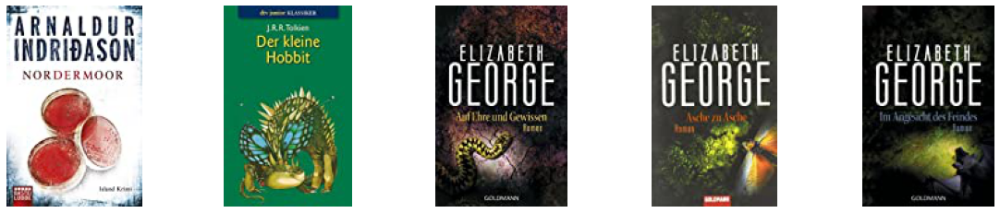

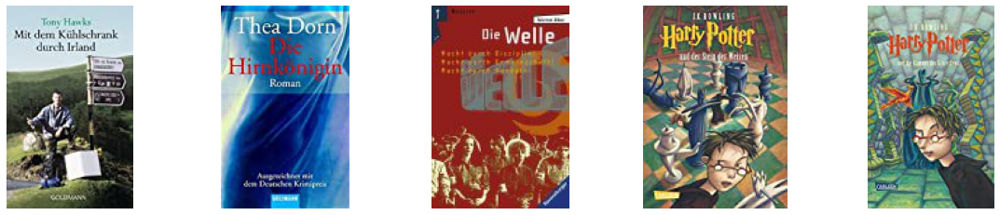

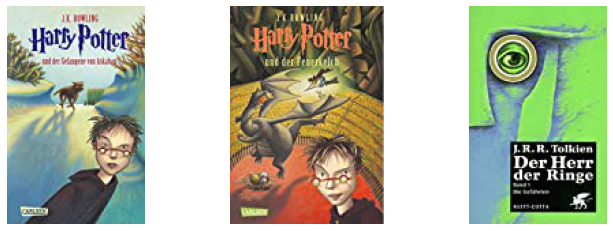

Такие рекомендации


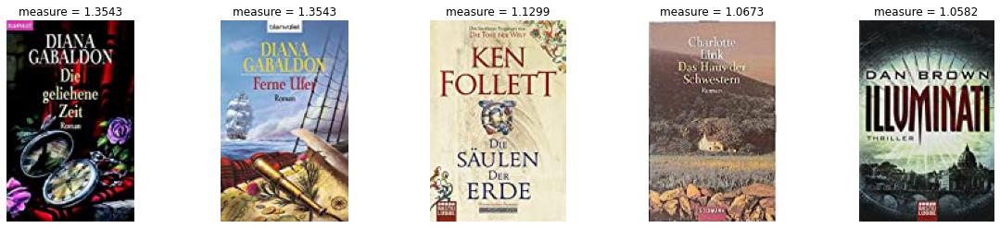

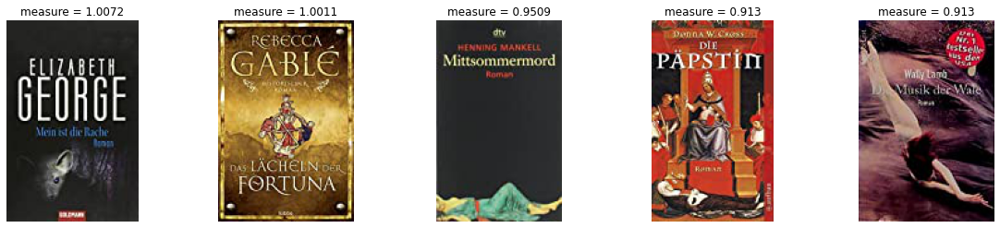

In [48]:
CollModel.user_based(276847)

Для таких товаров


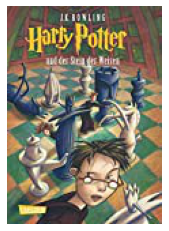

Такие рекомендации


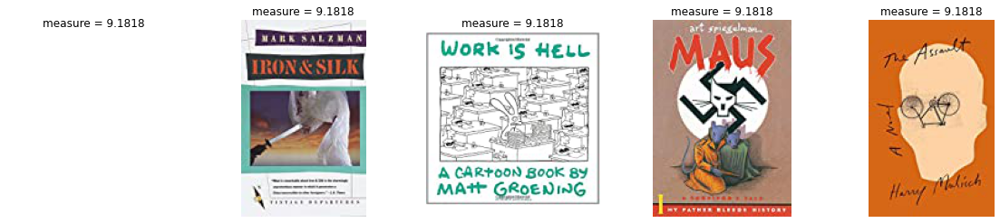

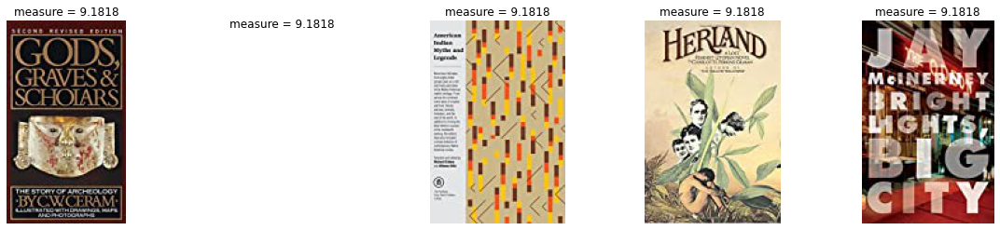

In [49]:
CollModel.item_based('3551551677', 10)

 Матричная Факторизация

In [38]:
!pip install lightfm
from lightfm import LightFM

     |████████████████████████████████| 317kB 5.3MB/s 
  Created wheel for lightfm: filename=lightfm-1.16-cp36-cp36m-linux_x86_64.whl size=704269 sha256=0294bcd0d1fd7a145e19027142a7c2ea9a9bfde51138689ddd11faa154b99714
  Stored in directory: /root/.cache/pip/wheels/c6/64/d4/673c7277f71ac4c5ad4835b94708c01b653ef2d3aa78ef20aa
Successfully built lightfm


In [39]:
class MatrixFactorization:

  def __init__(self, interactions, k):
    self.interactions = interactions.copy()
    self.k = k
    self.book_encoder = LabelEncoder()
    self.user_encoder = LabelEncoder()
    self.interactions['Enc_ISBN'] = self.book_encoder.fit_transform(self.interactions['ISBN'])
    self.interactions['Enc_User-ID'] = self.user_encoder.fit_transform(self.interactions['User-ID'])

    self.books = self.interactions[['ISBN', 'picture_url']].drop_duplicates().reset_index()
    self.csr_rates = coo_matrix((self.interactions['Book-Rating'], (self.interactions['Enc_User-ID'], self.interactions['Enc_ISBN'])),
                                shape=(len(set(self.interactions["Enc_User-ID"])), len(set(self.interactions["Enc_ISBN"]))))
    self.user_embs = None
    self.items_embs = None

  def FM(self):
    U, S, V = svds(self.csr_rates.astype(float), k=self.k)
    self.user_embs = U
    self.items_embs = V.T

  def LightFM(self):
    model = LightFM(loss='warp', no_components=self.k, learning_rate=0.03, learning_schedule="adadelta")
    model.fit(self.csr_rates, epochs=5, num_threads=40, verbose=True)
    _, self.user_embs = model.get_user_representations()
    _, self.items_embs = model.get_item_representations()

  def I2I(self, book_isbn, top_n):
    if self.items_embs is None or self.user_embs is None:
      raise RuntimeError('call  FM() or LightFM() first!')
    book_isbn_enc = self.book_encoder.transform([book_isbn])[0]
    metrics = cosine_similarity([self.items_embs[book_isbn_enc]], self.items_embs)
    print("Для таких товаров")
    rec_imaging([book_isbn], self.books[self.books['ISBN'] == book_isbn]['picture_url'])
    print("Такие рекомендации")
    rec_icbn_enc = np.argsort(-metrics)[0][1:top_n]
    book_isbn_dec = self.book_encoder.inverse_transform(rec_icbn_enc)
    rec_imaging(rec_icbn_enc, self.books[self.books['ISBN'].isin(book_isbn_dec)]['picture_url'], -np.round(np.sort(-metrics)[0][1:top_n], 4))


  def U2I(self, user_id, top_n):
    if self.items_embs is None or self.user_embs is None:
      raise RuntimeError('call  FM() or LightFM() first!')
    user_id_enc = self.user_encoder.transform([user_id])[0]
    metrics = cosine_similarity([self.user_embs[user_id_enc]], self.items_embs)
    print("Для этого пользователя:")
    user_ints = self.interactions[self.interactions["User-ID"] == user_id]
    rec_imaging(user_ints['ISBN'], self.books[self.books['ISBN'].isin(user_ints['ISBN'])]['picture_url'])
    print("Такие рекомендации:")
    visited_isbns_enc = self.book_encoder.transform(user_ints['ISBN'])
    # Убираем то, что пользователь уже купил
    metrics[0][visited_isbns_enc] = 0
    rec_icbn_enc = np.argsort(-metrics)[0][1:top_n]
    book_isbn_dec = self.book_encoder.inverse_transform(rec_icbn_enc)
    rec_imaging(rec_icbn_enc, self.books[self.books['ISBN'].isin(book_isbn_dec)]['picture_url'], -np.round(np.sort(-metrics)[0][1:top_n], 4))

In [40]:
simple_svd = MatrixFactorization(interactions, 1000)
simple_svd.LightFM()

Epoch: 100%|██████████| 5/5 [00:23<00:00,  4.62s/it]


Для таких товаров


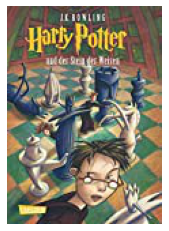

Такие рекомендации


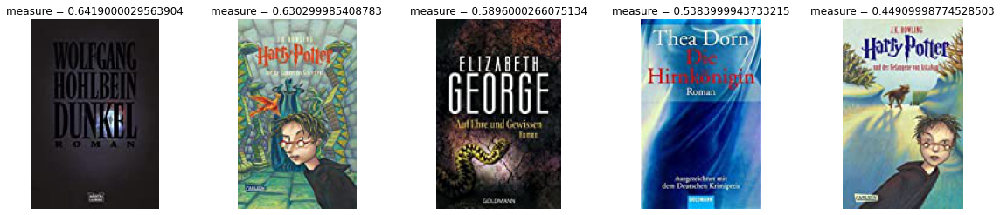

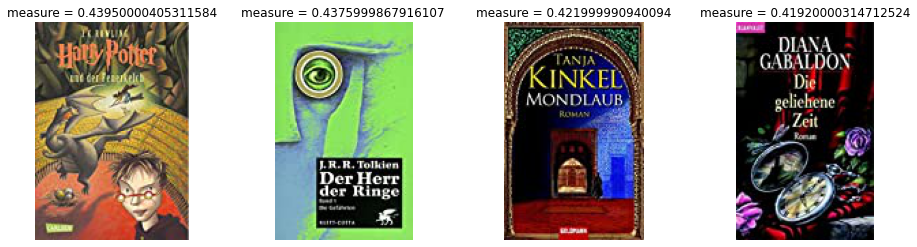

In [41]:
simple_svd.I2I('3551551677', 10)

Для этого пользователя:


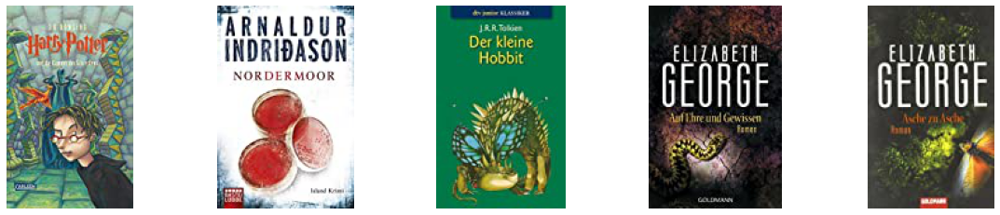

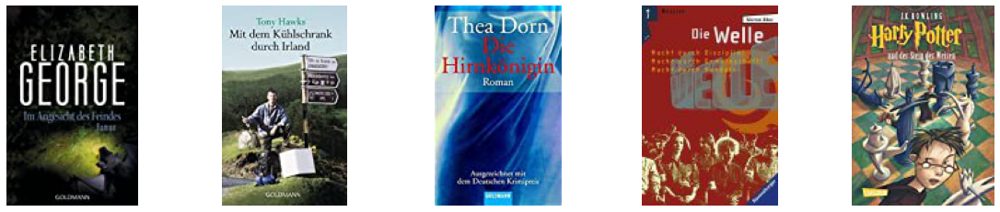

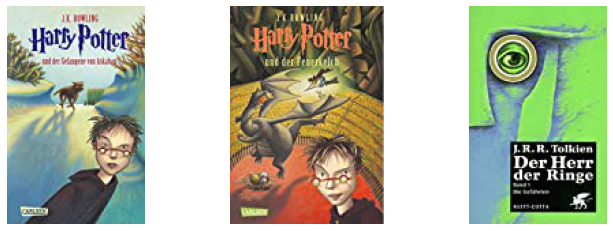

Такие рекомендации:


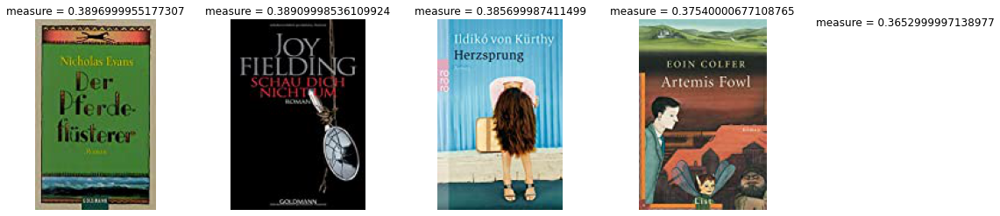

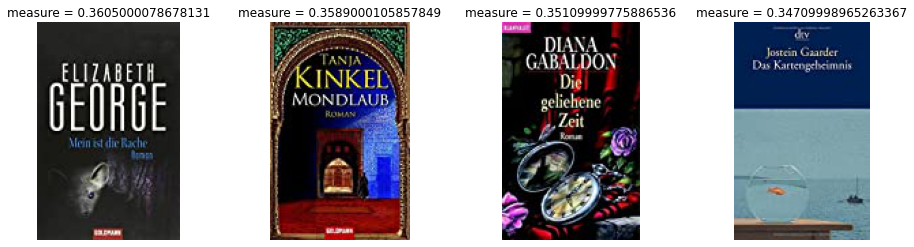

In [42]:
simple_svd.U2I(276847, 10)